In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from sklearn.cluster import KMeans
from scipy.spatial import ConvexHull
from matplotlib.patches import Polygon

from dms import geometry
from dms.dataloader import EvaluationDataset
from dms.dataloader import ImageLoader
from dms.clusters import ClusterCorrespondence
from dms.estimation import estimate_relative_pose
from dms.visualization import MatchPlotter

### Load image pair

Image 1: data/megadepth1500-images/images/0022/998312093_3421192cdc_o.jpg
Image 2: data/megadepth1500-images/images/0022/2362913557_5e02e49df8_o.jpg


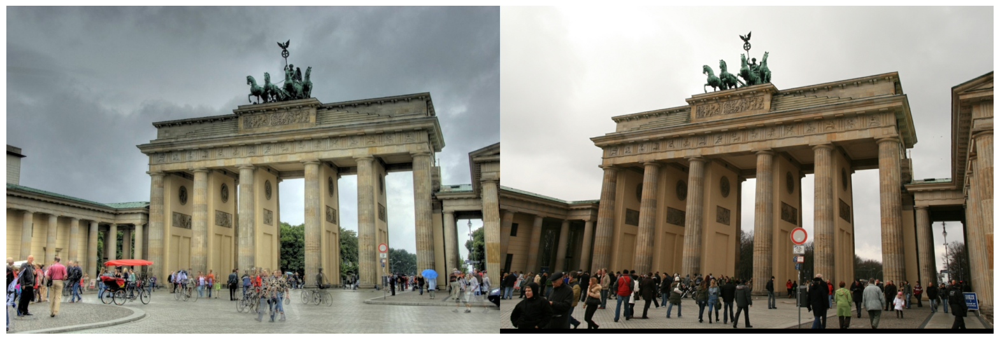

In [2]:
DATASET = "megadepth1500"
POINTS = "DKM"
THRESHOLD_PIXELS = 1.0
CLUSTERING_METHOD = '4D'  

data_path = f'data/{DATASET}_{POINTS.lower()}.h5'
images_path = f'data/{DATASET}-images/images'

dataset = EvaluationDataset(data_path, images_path)
image_pair = dataset[1499]  # 1499 is a good example

im1_path, im2_path = image_pair.image_paths()

print(f"Image 1: {im1_path}")
print(f"Image 2: {im2_path}")
plotter = MatchPlotter(im1_path, im2_path)
plotter.draw_images()

### Draw semi-dense matches

(839.0, 0.0)

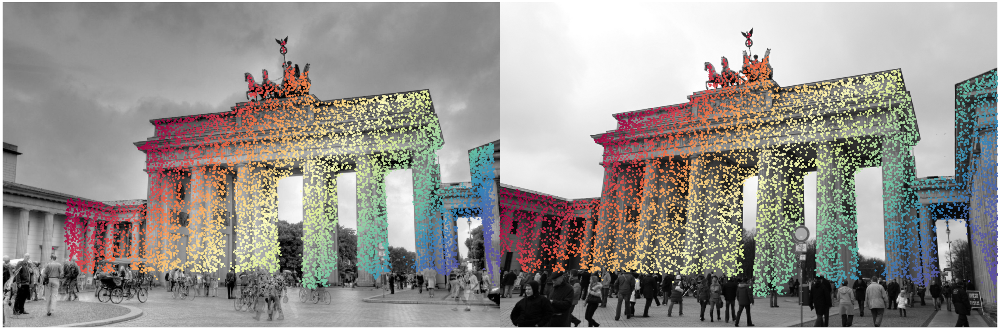

In [3]:
im1 = ImageLoader(im1_path, grayscale=True).as_numpy()
im2 = ImageLoader(im2_path, grayscale=True).as_numpy()

# Concatenate images
h1, w1 = im1.shape[:2]
h2, w2 = im2.shape[:2]
img = np.zeros((max(h1, h2), w1 + w2, 3), dtype=im1.dtype)
img[:h1, :w1, :] = im1
img[:h2, w1:, :] = im2
im1 = plotter._im1
im2 = plotter._im2
h1, w1 = im1.shape[:2]
h2, w2 = im2.shape[:2]

cmap = matplotlib.colormaps['Spectral']

plt.figure(figsize=(50, 50))
plt.imshow(img)
plt.axis('off')

x1, x2 = image_pair.matches()
ind = np.argsort(x1[:, 0] + x1[:, 1])

for k, (z1, z2) in enumerate(zip(x1[ind], x2[ind])):

    c = cmap(k/len(ind))
    plt.plot(z1[0], z1[1], color=c, alpha=0.8, marker='.', markersize=10)
    plt.plot(z2[0]+w1, z2[1], color=c, alpha=0.8, marker='.', markersize=10)

# Limit plotting to inside of images
plt.xlim(0, w1+w2)
plt.ylim(min(h1,h2), 0)


### Create clusters

(839.0, 0.0)

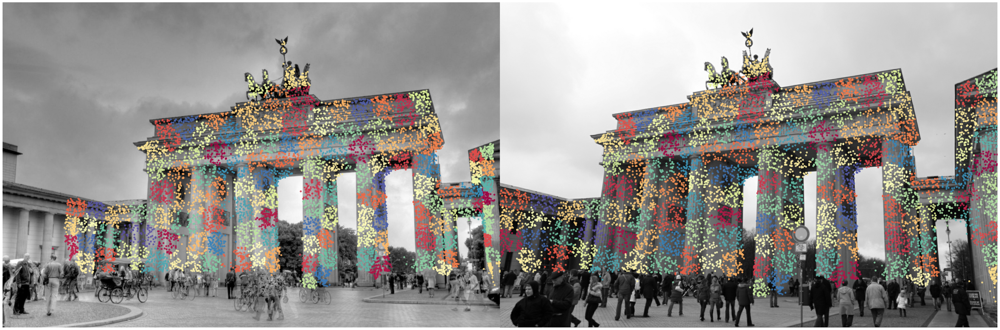

In [4]:
def cluster_list_to_dict(clusters):
    return {str(c['number']): c for c in clusters}

def run_kmeans(kmeans_estimator, image_pair, method='2D'):
    (x1, x2) = image_pair.matches()
    (x1c, x2c) = image_pair.matches(calibrated=True)

    if method == '2D':
        features = x1c
    elif method == '4D':
        features = np.c_[x1c, x2c]
    elif method == '9D':
        features = geometry.setup_fundamental_dlt_matrix(x1c, x2c)
    else:
        raise ValueError(f'Unknown KMeans method: {method}.')
    
    if len(features) < kmeans_estimator.get_params()['n_clusters']:
        return None

    kmeans_clusters = kmeans_estimator.fit(features)

    n_clusters = kmeans_clusters.get_params()['n_clusters']
    clusters = []
    for k in range(n_clusters):
        labels = (kmeans_clusters.labels_ == k)
        clusters.append({
            'x1': x1[labels],
            'x2': x2[labels],
            'num_points': np.sum(labels),
            'number': k,
        })

    return clusters

kmeans_estimator = KMeans(n_clusters=128, random_state=0)
clusters = run_kmeans(kmeans_estimator, image_pair, CLUSTERING_METHOD)

plt.figure(figsize=(50, 50))
plt.imshow(img)
plt.axis('off')

for k, cluster in enumerate(clusters):
    c = cmap(k/len(clusters))    

    z1 = cluster['x1']
    z2 = cluster['x2']

    plt.scatter(z1[:, 0], z1[:, 1], color=c, alpha=0.8, marker='.', s=80)
    plt.scatter(z2[:, 0]+w1, z2[:, 1], color=c, alpha=0.8, marker='.', s=80)

# Limit plotting to inside of images
plt.xlim(0, w1+w2)
plt.ylim(min(h1,h2), 0)


### Summarize dense matches

(839.0, 0.0)

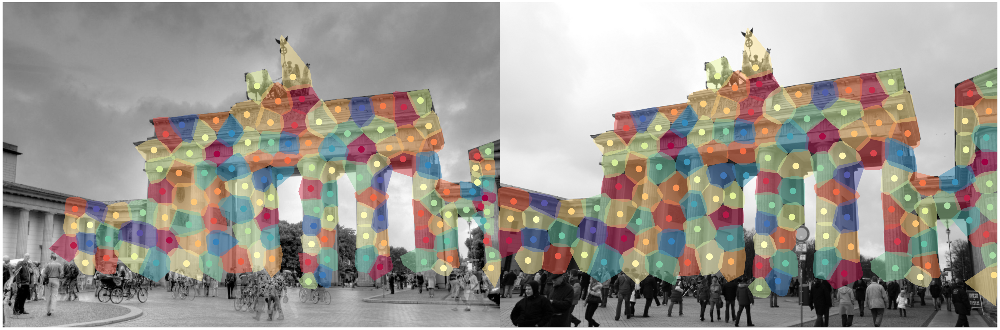

In [5]:
def plot_hull(points, color, alpha=0.5, k=1.1):
    #plt.plot(points[:,0], points[:,1], 'o')
    hull = ConvexHull(points)
    cent = np.mean(points, axis=0)
    pts = points[hull.vertices]

    poly = Polygon(k*(pts - cent) + cent, closed=True,
                capstyle='round', facecolor=color, alpha=alpha)
    plt.gca().add_patch(poly)


K1, K2 = image_pair.calib_matrices()
summarized_matches = [ClusterCorrespondence(c, K1, K2) for c in clusters]

plt.figure(figsize=(50, 50))
plt.imshow(img)
plt.axis('off')

for k, summarized in enumerate(summarized_matches):
    c = cmap(k/len(summarized_matches))    

    dense_x1 = summarized.x1
    dense_x2 = summarized.x2

    # Offset second image keypoints by width of first image
    dense_x2w = dense_x2.copy()
    dense_x2w[:,0] += w1

    # plot the convex hull of x1
    a = 0.5
    scale = 1.2
    plot_hull(dense_x1, c, alpha=a, k=scale)
    plot_hull(dense_x2w, c, alpha=a, k=scale)

    # Plot representative matches
    x01 = summarized.x01_pixels
    x02 = summarized.x02_pixels
    plt.plot([x01[0], x02[0]+w1], [x01[1], x02[1]], '.', color=c, markersize=7*5)

# Limit plotting to inside of images
plt.xlim(0, w1+w2)
plt.ylim(min(h1,h2), 0)

In [6]:
K1, K2 = image_pair.calib_matrices()
cam1, cam2 = image_pair.cameras()

x1c = geometry.calibrate_pts(x1, K1)
x2c = geometry.calibrate_pts(x2, K2)

clusters = image_pair.clusters(min_size=1)

image_pair_data = {
    'x1': x1,
    'x1c': x1c,
    'x2': x2,
    'x2c': x2c,
    'K1': K1,
    'K2': K2,
    'cam1': cam1,
    'cam2': cam2,
    'f1': np.mean([K1[0,0], K1[1,1]]),
    'f2': np.mean([K2[0,0], K2[1,1]]),
    'clusters': clusters,
    'ecorrs': summarized_matches,
    'key': image_pair.key,
    'image_pair': image_pair,
}

mean_focal_length = np.mean([image_pair_data['f1'], image_pair_data['f2']])
opt_params = {
    'threshold_E': THRESHOLD_PIXELS / mean_focal_length,
    'filter_outliers': False,
}

data = {**image_pair_data, **opt_params}

for setting in [
        ('dense', 'dense', 'dense'),
        ('center', 'center', 'center'),
        ('center', 'center', 'approx')
    ]:
    method_name = ''.join([s[0].upper() for s in setting])
    result, runtime = estimate_relative_pose(data, *setting)
    print(f'Method {method_name} ran in {runtime} ms')
    print(result)

Method DDD ran in 0.068519 ms
{'R': array([[ 0.99800765, -0.01701128,  0.06075647],
       [ 0.01272604,  0.99744932,  0.07023461],
       [-0.06179628, -0.06932149,  0.99567854]]), 't': array([-0.37415137, -0.22818633, -0.89890883])}
Method CCC ran in 0.001168 ms
{'R': array([[ 0.99801883, -0.01728025,  0.06049639],
       [ 0.01300255,  0.99743389,  0.07040287],
       [-0.06155773, -0.06947678,  0.99568249]]), 't': array([-0.37333961, -0.2286657 , -0.89921497])}
Method CCA ran in 0.001374 ms
{'R': array([[ 0.99801113, -0.01707674,  0.06068093],
       [ 0.01277809,  0.99742746,  0.07053496],
       [-0.06172933, -0.06961929,  0.99566191]]), 't': array([-0.37392752, -0.22905731, -0.89887129])}
